# Solar Data Tools Webinar

Demonstration of the Solar Data Tools pipeline on open source data provided by the [DOE Data Prize](https://openei.org/wiki/PVDAQ/PVData_Map)

### Agenda

- Demonstrate basic software usage on Inverter 01 from site 2107 "Farm Solar Array" (CA)
- Compare and contrast system degradation with RdTools
- Take a look at site 2015 "Maui Ocean Center" (HI)

In [1]:
# scientific python imports
import pandas as pd
import numpy as np

# plotting imports
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200

# file management imports
import os
import boto3  # <- for downloading DOE Data Prize files from OEDI S3 bucket

# SDT imports
from solardatatools import DataHandler

# Timing
from time import time
notebook_start = time()

## Data access and loading

To be able to download the files automatically with boto3, you must have AWS command line tools (CLT) installed and authorized on your computer. Otherwise, you can download the files manually from [here](https://data.openei.org/s3_viewer?bucket=oedi-data-lake&prefix=pvdaq%2F2023-solar-data-prize%2F), and put them in the "data" folder in this repository.

In [2]:
def load_data(filename, s3_bucket, s3_key, is_2107=False):
    local_file_path = filename
    # Check if the file exists locally
    if os.path.exists(local_file_path):
        print(f"Loading local CSV file: {local_file_path}")
    else:
        print(f"Local CSV file not found. Downloading from S3.")
        download_csv_from_s3(s3_bucket, s3_key, local_file_path)
    data_frame = load_csv(local_file_path, is_2107=is_2107)
    return data_frame

def download_csv_from_s3(bucket_name, s3_key, local_destination):
    s3 = boto3.client("s3")
    s3.download_file(bucket_name, s3_key, local_destination)

def load_csv(file_path, is_2107=False):
    df = pd.read_csv(
        file_path,
        index_col=0,
        parse_dates=[0],
    )
    return df

## Analysis of inverter 01 from site 2017 "Solar Farm Array"

In [3]:
df_2107 = load_data(
    filename="data/2107_electrical_data.csv",
    s3_bucket="oedi-data-lake",
    s3_key="pvdaq/2023-solar-data-prize/2107_OEDI/data/2107_electrical_data.csv"
)
df_2107.head()

Loading local CSV file: data/2107_electrical_data.csv


,inv_01_dc_current_inv_149579,inv_01_dc_voltage_inv_149580,inv_01_ac_current_inv_149581,inv_01_ac_voltage_inv_149582,inv_01_ac_power_inv_149583,inv_02_dc_current_inv_149584,inv_02_dc_voltage_inv_149585,inv_02_ac_current_inv_149586,inv_02_ac_voltage_inv_149587,inv_02_ac_power_inv_149588,...,inv_23_dc_current_inv_149689,inv_23_dc_voltage_inv_149690,inv_23_ac_current_inv_149691,inv_23_ac_voltage_inv_149692,inv_23_ac_power_inv_149693,inv_24_dc_current_inv_149694,inv_24_dc_voltage_inv_149695,inv_24_ac_current_inv_149696,inv_24_ac_voltage_inv_149697,inv_24_ac_power_inv_149698
measured_on,,,,,,,,,,,,,,,,,,,,,
2017-11-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-11-01 00:05:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-11-01 00:10:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-11-01 00:15:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-11-01 00:20:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


With our data loaded as a Pandas data frame, we're ready to instantiate the Solar Data Tools data handler.

In [4]:
dh_2107 = DataHandler(df_2107)

In this case, we happen to know ahead of time that the data is affected by Daylight Savings Times shifts, we we'll just correct that.

In [5]:
dh_2107.fix_dst()

Now we're ready to run the data onboarding pipleline. The SDT approach analyzes one power (or irradiance) time series in isolation, without the need for a site model or correlated meteorlogical data. Here we select the 5th column, corresponding to the AC power generated by inverter 01.

In [6]:
col_ix = 4
print(df_2107.columns[col_ix])
dh_2107.run_pipeline(power_col=df_2107.columns[col_ix])

inv_01_ac_power_inv_149583

            *********************************************
            * Solar Data Tools Data Onboarding Pipeline *
            *********************************************

            This pipeline runs a series of preprocessing, cleaning, and quality
            control tasks on stand-alone PV power or irradiance time series data.
            After the pipeline is run, the data may be plotted, filtered, or
            further analyzed.

            Authors: Bennet Meyers and Sara Miskovich, SLAC

            (Tip: if you have a mosek [https://www.mosek.com/] license and have it
            installed on your system, try setting solver='MOSEK' for a speedup)

            This material is based upon work supported by the U.S. Department
            of Energy's Office of Energy Efficiency and Renewable Energy (EERE)
            under the Solar Energy Technologies Office Award Number 38529.

            


task list: 100%|██████████████████████████████████| 7/7 [00:31<00:00,  4.44s/it]



total time: 31.10 seconds
--------------------------------
Breakdown
--------------------------------
Preprocessing              10.98s
Cleaning                   0.66s
Filtering/Summarizing      19.46s
    Data quality           0.30s
    Clear day detect       0.50s
    Clipping detect        7.55s
    Capacity change detect 11.12s



### data quality inspection

SDT provides a number of tools to inspect the data set. The first is the top-level report.

In [7]:
dh_2107.report()


-----------------
DATA SET REPORT
-----------------
length               6.02 years
capacity estimate    28.33 kW
data sampling        5 minutes
quality score        0.87
clearness score      0.50
inverter clipping    True
clipped fraction     0.26
capacity changes     True
data quality warning True
time shift errors    False
time zone errors     False
            


We can also make a machine-readable version, which is useful when processing many files/columns for creating a summary table of all data sets.

In [8]:
dh_2107.report(return_values=True, verbose=False)

{'length': 6.021917808219178,
 'capacity': 28.332199999999954,
 'sampling': 5,
 'quality score': 0.873066424021838,
 'clearness score': 0.49545040946314833,
 'inverter clipping': True,
 'clipped fraction': 0.25932666060054593,
 'capacity change': True,
 'data quality warning': True,
 'time shift correction': False,
 'time zone correction': 0}

The second thing I always do is plot the measured data as a heatmap, to get an overall feel for the data set. Solar data tools provides a "raw" view and a "filled" view, where missing data has been filled and issues like time shifts have been corrected.

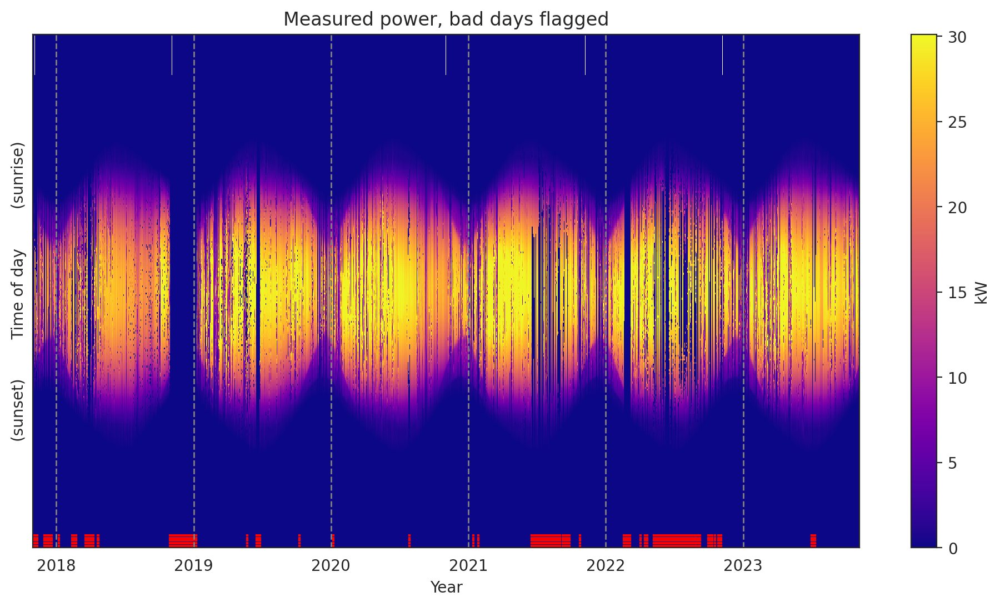

In [9]:
dh_2107.plot_heatmap('raw', flag='bad');

Each of the subroutines in the onboarding pipeline have plotting functions associated with them, so provide insight into how the algorithm performed. For example, we saw in the report that there were "capacity changes". We can inspect this analysis.

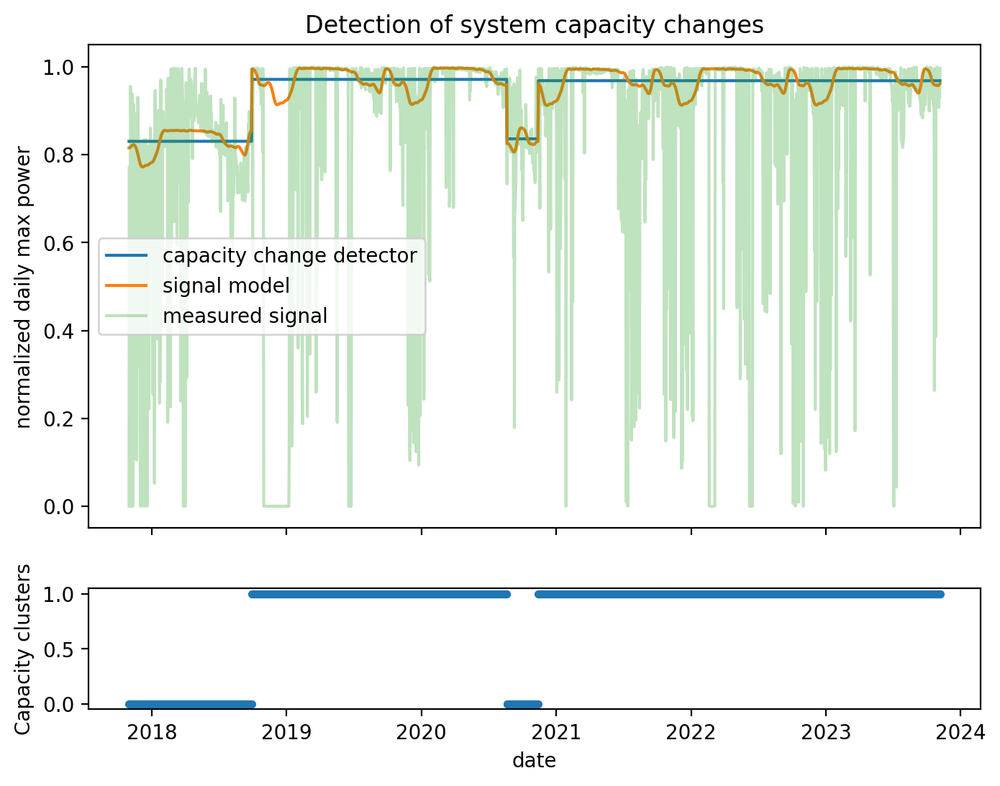

In [10]:
dh_2107.plot_capacity_change_analysis();

Here is a "polar transform" view of the measured power. We bin times of the year and transform them into azimuth-angle location and average the measured power in each bin. Some bins near the top have no observations at this scale.

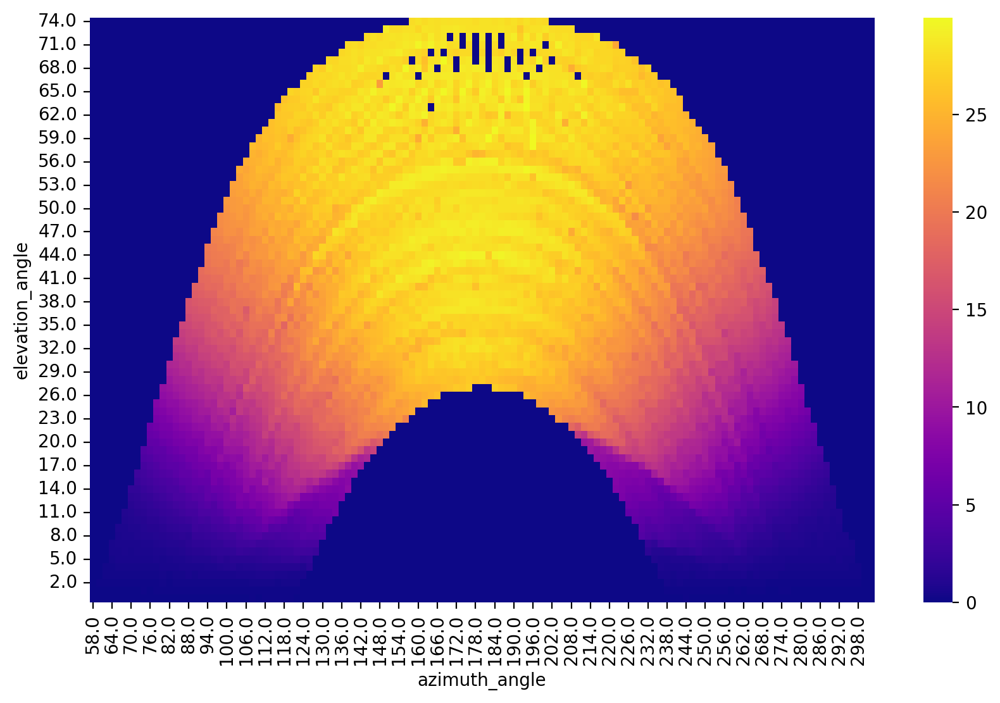

In [11]:
dh_2107.plot_polar_transform(lat=38.996306,
                             lon=-122.134111,
                             tz_offset=-8);

When objects are causing shade, they are identifiable in this view. For example, the irradiance sensor is shaded by a pole.

Loading local CSV file: data/2107_irradiance_data.csv

            *********************************************
            * Solar Data Tools Data Onboarding Pipeline *
            *********************************************

            This pipeline runs a series of preprocessing, cleaning, and quality
            control tasks on stand-alone PV power or irradiance time series data.
            After the pipeline is run, the data may be plotted, filtered, or
            further analyzed.

            Authors: Bennet Meyers and Sara Miskovich, SLAC

            (Tip: if you have a mosek [https://www.mosek.com/] license and have it
            installed on your system, try setting solver='MOSEK' for a speedup)

            This material is based upon work supported by the U.S. Department
            of Energy's Office of Energy Efficiency and Renewable Energy (EERE)
            under the Solar Energy Technologies Office Award Number 38529.

            


task list: 100%|██████████████████████████████████| 7/7 [00:23<00:00,  3.38s/it]




total time: 23.64 seconds
--------------------------------
Breakdown
--------------------------------
Preprocessing              9.17s
Cleaning                   0.50s
Filtering/Summarizing      13.97s
    Data quality           0.31s
    Clear day detect       0.53s
    Clipping detect        7.43s
    Capacity change detect 5.69s



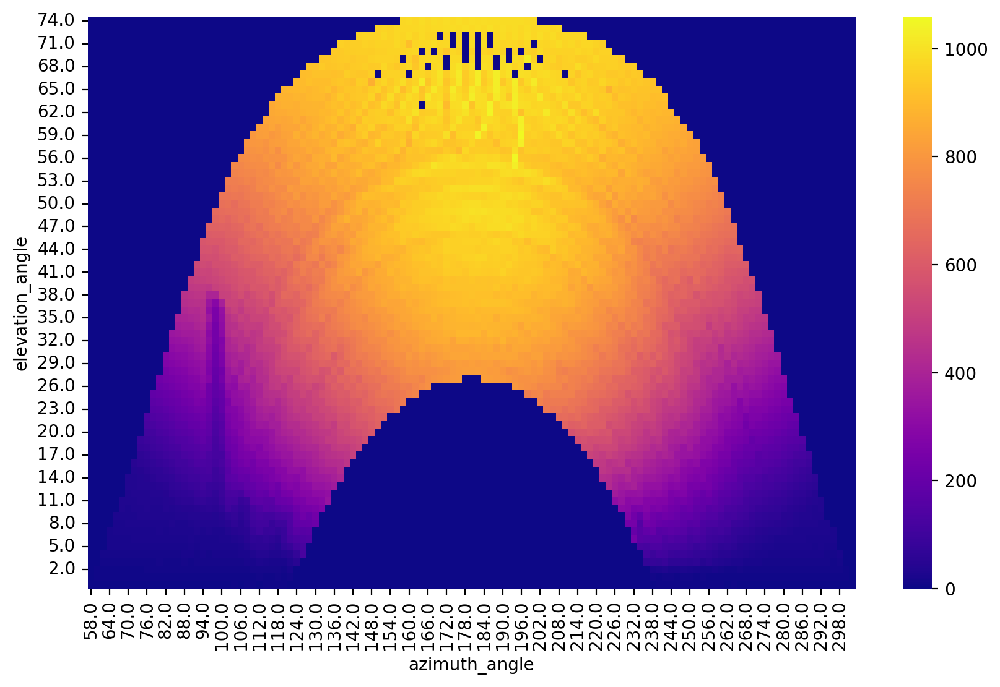

In [12]:
df_2107_irr = load_data(
    filename="data/2107_irradiance_data.csv",
    s3_bucket="oedi-data-lake",
    s3_key="pvdaq/2023-solar-data-prize/2107_OEDI/data/2107_irradiance_data.csv"
)
dh_2107_irr = DataHandler(df_2107_irr)
dh_2107_irr.fix_dst()
dh_2107_irr.run_pipeline(verbose=True)
dh_2107_irr.plot_polar_transform(lat=38.996306,
                                 lon=-122.134111,
                                 tz_offset=-8);

In this case, we happen to know the latitude and longitude. But what if you need that information?

In [13]:
# just provide a GMT offset for the timestamps
dh_2107.setup_location_and_orientation_estimation(-8)

lat_est = dh_2107.estimate_latitude()
lon_est = dh_2107.estimate_longitude()

result = f"""
      Actual   Estimated
Lat:  {38.996306:>6.1f}    {lat_est:>6.1f}
Lon:  {-122.134111:>6.1f}    {lon_est:>6.1f}
"""
print(result)


      Actual   Estimated
Lat:    39.0      40.0
Lon:  -122.1    -122.2



/Users/mdecegli/opt/anaconda3/envs/oss_webinar/lib/python3.10/site-packages/cvxpy/reductions/solvers/solving_chain.py:336: FutureWarning: 
    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    
  warnings.warn(ECOS_DEPRECATION_MSG, FutureWarning)


(roughly 72 miles from the actual location)

### Loss factor analysis

After running the main pipeline, we can now run other analysis, such as estimating the long-term, bulk degradation rate and the total losses from weather, outages, capacity changes, and soiling. As with the data quality analytics in the pipeline, this method relies on a technique of [statistical signal decomposition](https://web.stanford.edu/~boyd/papers/sig_decomp_mprox.html). We fit many similar signal decomposition models with Monte Carlo sampling on the parameters to generate a stable estimate of the degradation rate with confidence bounds. 

In [14]:
dh_2107.run_loss_factor_analysis()


            ************************************************
            * Solar Data Tools Degradation Estimation Tool *
            ************************************************

            Monte Carlo sampling to generate a distributional estimate
            of the degradation rate [%/yr]

            The distribution typically stabilizes in 50-100 samples.

            Author: Bennet Meyers, SLAC

            This material is based upon work supported by the U.S. Department
            of Energy's Office of Energy Efficiency and Renewable Energy (EERE)
            under the Solar Energy Technologies Office Award Number 38529.

            


10it [01:02,  6.74s/it]

P50, P02.5, P97.5: 0.047, -0.135, 0.144
changes: -3.850e-03, 0.000e+00, 0.000e+00


20it [02:06,  6.33s/it]

P50, P02.5, P97.5: 0.055, -0.135, 0.244
changes: -2.341e-03, 0.000e+00, 0.000e+00


22it [02:26,  6.65s/it]


Performing loss factor analysis...

                    ***************************************
                    * Solar Data Tools Loss Factor Report *
                    ***************************************

                    degradation rate [%/yr]:                     0.058
                    deg. rate 95% confidence:          [-0.135,  0.244]
                    total energy loss [kWh]:                 -148004.3
                    bulk deg. energy loss (gain) [kWh]:          711.4
                    soiling energy loss [kWh]:                 -8504.0
                    capacity change energy loss [kWh]:        -13417.2
                    weather energy loss [kWh]:                -68456.3
                    system outage loss [kWh]:                 -58338.3
                    


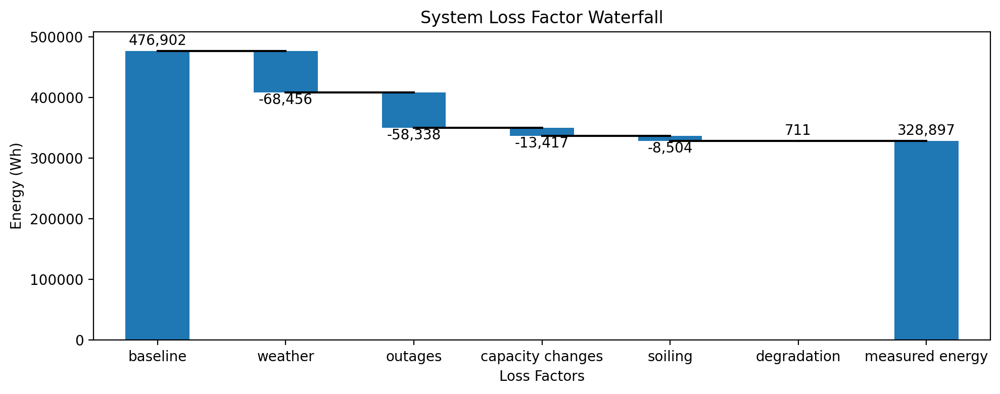

In [15]:
dh_2107.loss_analysis.plot_waterfall();

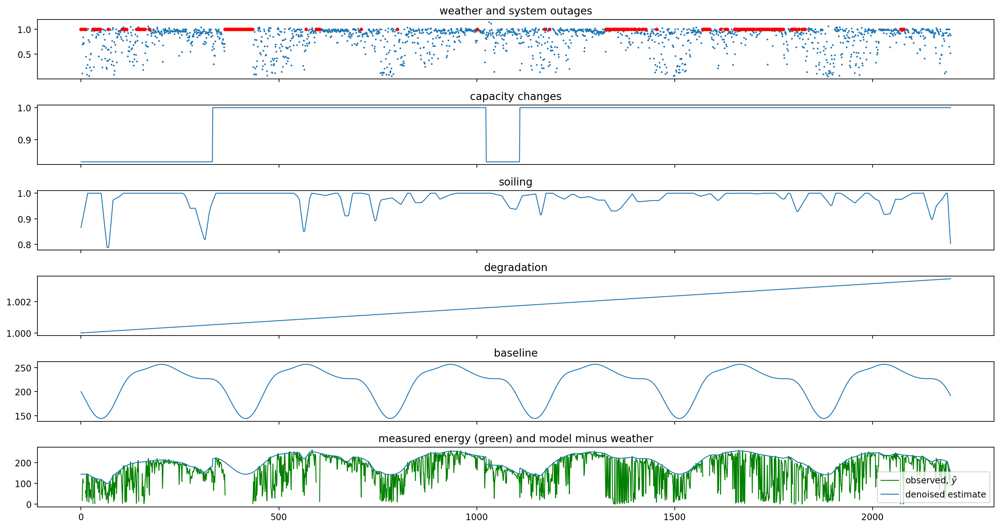

In [16]:
dh_2107.loss_analysis.plot_decomposition();

### Comparison to RdTools

Having generated an estimate of the degradation rate with confidence bounds of inverter 1, we can compare with the results from RdTools to see if they agree. There are multiple possible configurations to choose from when running an RdTools analysis, and we choose to compare against the NSRDB (satellite-based) analysis without filtering for clipped times. As with the SDT approach, this estimates the _AC_ rather than DC degradation rate of the system in a way that does not require on-site irradiance measurements, making it close to an apples-to-apples comparison. 

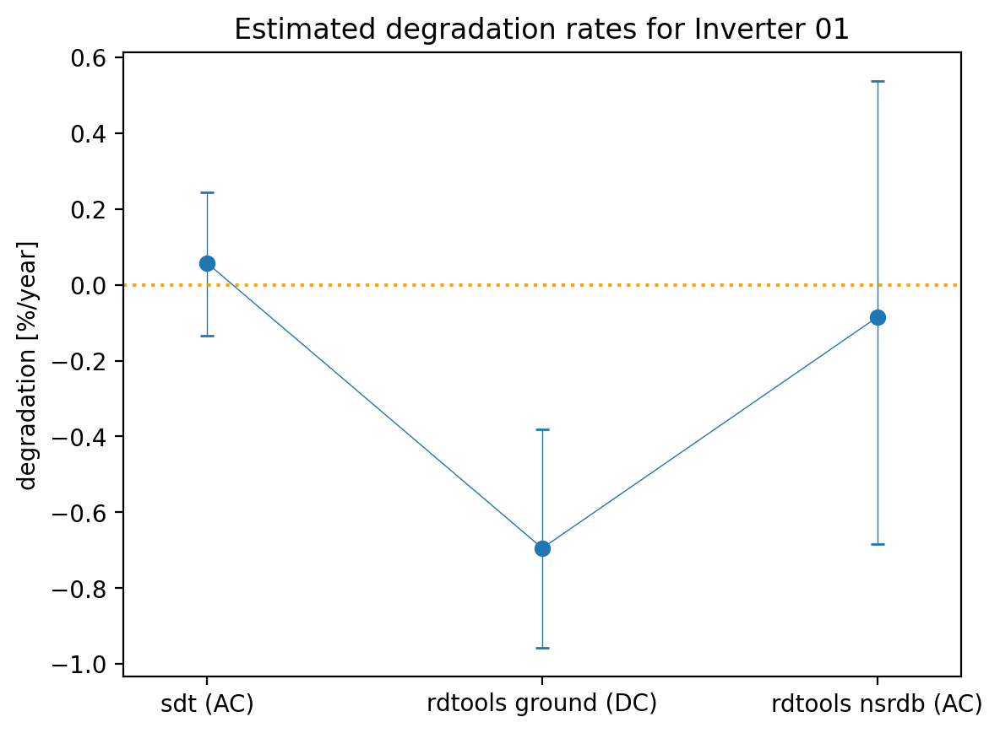

In [17]:
comparison = pd.read_csv('data/inverter01_comparison.csv', index_col=0)
xx = np.arange(3)
yy = np.asarray([dh_2107.loss_analysis.degradation_rate, 
                 comparison['yy'].iloc[1],
                 comparison['yy'].iloc[2]])
yub = np.asarray([dh_2107.loss_analysis.degradation_rate_ub,
                  comparison['yub'].iloc[1],
                  comparison['yub'].iloc[2]])
ylb = np.asarray([dh_2107.loss_analysis.degradation_rate_lb, 
                  comparison['ylb'].iloc[1],
                  comparison['ylb'].iloc[2]])
yerr = [yy - ylb, yub - yy]
plt.errorbar(xx, yy, yerr=yerr, marker='o', capsize=3, linewidth=0.5)
plt.xticks(ticks=[0,1,2], labels=comparison.index)
plt.axhline(0, ls=':', color='orange')
plt.xlim(-0.25, 2.25)
plt.ylabel('degradation [%/year]')
plt.title('Estimated degradation rates for Inverter 01');

## Analysis of site 2015 "Maui Ocean Center"

One feature of SDT is the speed with which a new analysis can be set up. Typically, all you need to start analyzing data from a new site is the ability to load power data into a data frame. This is even true for sites like 2105, which have complex and difficult to model roof configurations.

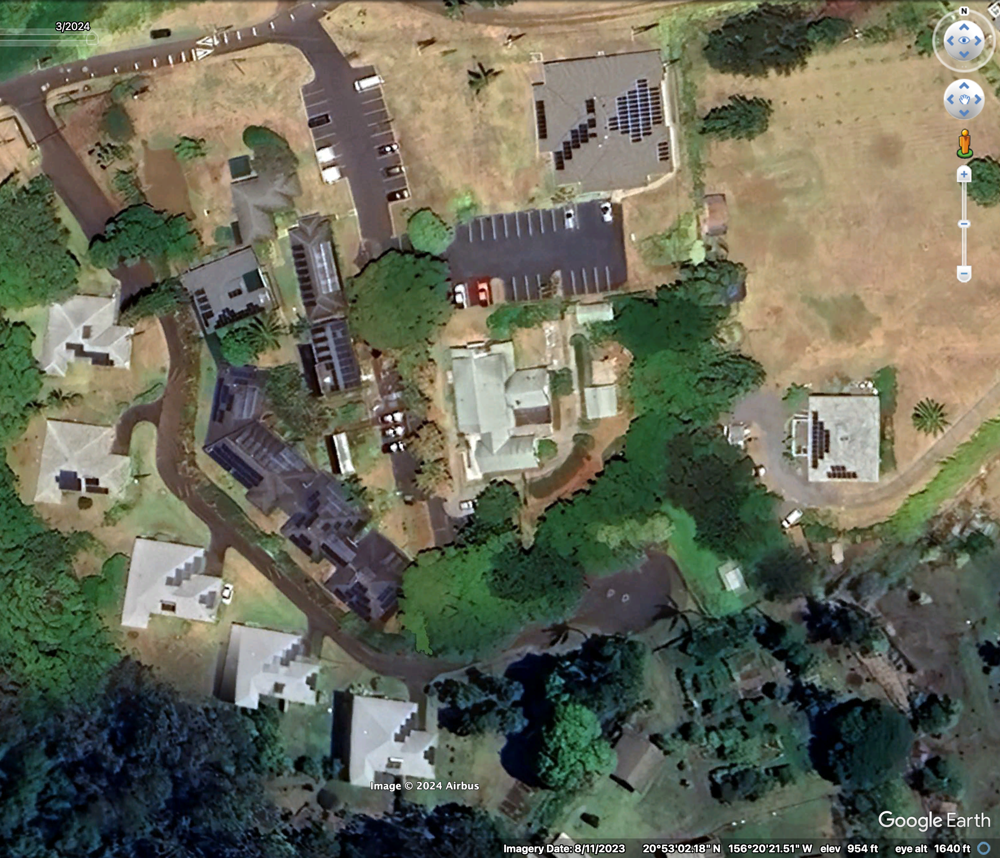

In [19]:
df_2105 = load_data(
    filename="data/2105_inv09_data.csv",
    s3_bucket="oedi-data-lake",
    s3_key="pvdaq/2023-solar-data-prize/2105_OEDI/data/2105_inv09_data.csv"
)
df_2105.head()

Loading local CSV file: data/2105_inv09_data.csv


,inv_string09_ac_output_(kwh)_inv_150212,inv_string09_ac_output_(power_factor)_inv_150213,inv_string09_ac_voltage_(v)_inv_150211,inv_string09_dc_voltage_(v)_inv_150210,inv_string09_temperature_(c)_inv_150214
measured_on,,,,,
2019-06-21 08:41:48,0.000,NaN,120.797,529.250,30.9840
2019-06-21 08:46:49,24.121,0.997012,121.531,399.000,33.9549
2019-06-21 08:51:49,24.975,0.998193,121.844,399.062,39.6553
2019-06-21 08:56:49,25.717,0.998244,121.047,399.125,44.1536
2019-06-21 09:01:49,26.486,0.999318,120.812,399.188,44.8437


In [20]:
col_ix = 0
print(df_2105.columns[col_ix])
dh_2105 = DataHandler(df_2105)
dh_2105.run_pipeline(power_col=df_2105.columns[col_ix])

inv_string09_ac_output_(kwh)_inv_150212

            *********************************************
            * Solar Data Tools Data Onboarding Pipeline *
            *********************************************

            This pipeline runs a series of preprocessing, cleaning, and quality
            control tasks on stand-alone PV power or irradiance time series data.
            After the pipeline is run, the data may be plotted, filtered, or
            further analyzed.

            Authors: Bennet Meyers and Sara Miskovich, SLAC

            (Tip: if you have a mosek [https://www.mosek.com/] license and have it
            installed on your system, try setting solver='MOSEK' for a speedup)

            This material is based upon work supported by the U.S. Department
            of Energy's Office of Energy Efficiency and Renewable Energy (EERE)
            under the Solar Energy Technologies Office Award Number 38529.

            


task list: 100%|██████████████████████████████████| 7/7 [00:23<00:00,  3.39s/it]



total time: 23.70 seconds
--------------------------------
Breakdown
--------------------------------
Preprocessing              4.64s
Cleaning                   0.39s
Filtering/Summarizing      18.67s
    Data quality           0.17s
    Clear day detect       0.41s
    Clipping detect        7.78s
    Capacity change detect 10.32s



In [21]:
dh_2105.report()


-----------------
DATA SET REPORT
-----------------
length               4.41 years
capacity estimate    41.86 kW
data sampling        5 minutes
quality score        0.97
clearness score      0.15
inverter clipping    True
clipped fraction     0.02
capacity changes     True
data quality warning True
time shift errors    False
time zone errors     False
            


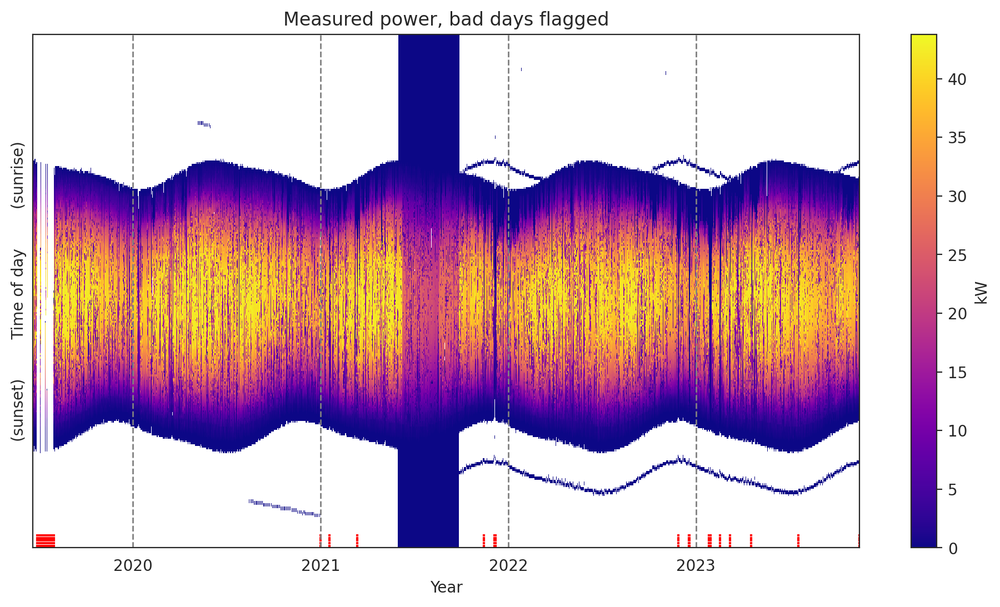

In [22]:
dh_2105.plot_heatmap('raw', flag='bad');

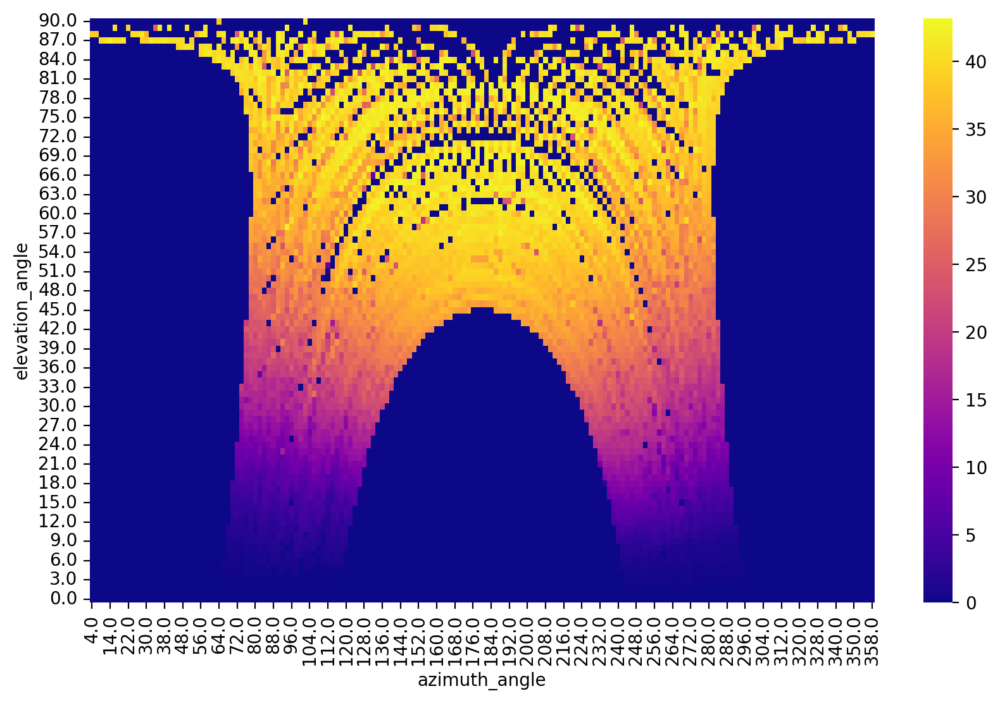

In [23]:
dh_2105.plot_polar_transform(lat=20.884134,
                             lon=-156.340543,
                             tz_offset=-10);

In [24]:
dh_2105.run_loss_factor_analysis()


            ************************************************
            * Solar Data Tools Degradation Estimation Tool *
            ************************************************

            Monte Carlo sampling to generate a distributional estimate
            of the degradation rate [%/yr]

            The distribution typically stabilizes in 50-100 samples.

            Author: Bennet Meyers, SLAC

            This material is based upon work supported by the U.S. Department
            of Energy's Office of Energy Efficiency and Renewable Energy (EERE)
            under the Solar Energy Technologies Office Award Number 38529.

            


10it [00:18,  2.05s/it]

P50, P02.5, P97.5: -2.046, -2.609, -1.764
changes: -7.290e-02, -3.839e-02, 0.000e+00


20it [00:39,  2.12s/it]

P50, P02.5, P97.5: -2.046, -2.609, -1.626
changes: -2.540e-02, 0.000e+00, 0.000e+00


30it [01:02,  2.26s/it]

P50, P02.5, P97.5: -1.926, -2.607, -1.632
changes: 3.143e-02, 9.597e-04, -2.004e-03


40it [01:24,  2.26s/it]

P50, P02.5, P97.5: -1.926, -2.597, -1.608
changes: 2.728e-02, 9.597e-04, -6.810e-04


50it [01:47,  2.23s/it]

P50, P02.5, P97.5: -1.980, -2.587, -1.614
changes: 4.150e-03, 9.597e-04, -6.810e-04


51it [01:51,  2.20s/it]


Performing loss factor analysis...

                    ***************************************
                    * Solar Data Tools Loss Factor Report *
                    ***************************************

                    degradation rate [%/yr]:                    -2.000
                    deg. rate 95% confidence:          [-2.586, -1.616]
                    total energy loss [kWh]:                 -124153.8
                    bulk deg. energy loss (gain) [kWh]:       -18502.9
                    soiling energy loss [kWh]:                -14612.2
                    capacity change energy loss [kWh]:        -11699.1
                    weather energy loss [kWh]:                -64220.1
                    system outage loss [kWh]:                 -15119.6
                    


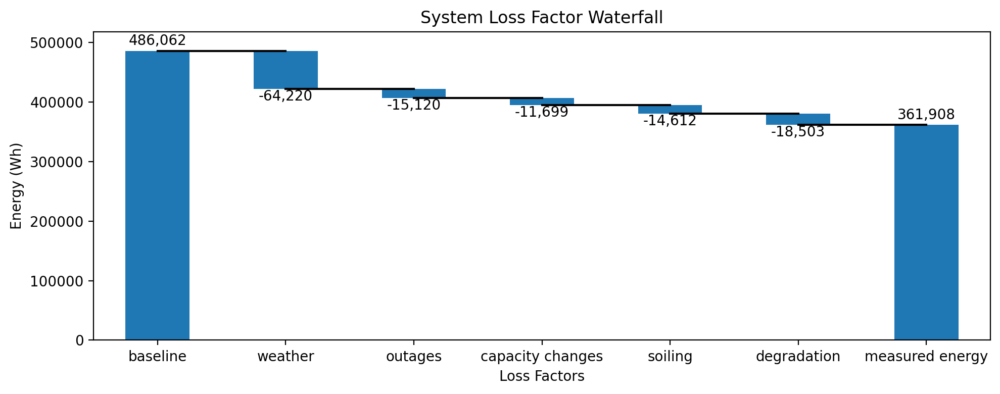

In [25]:
dh_2105.loss_analysis.plot_waterfall();

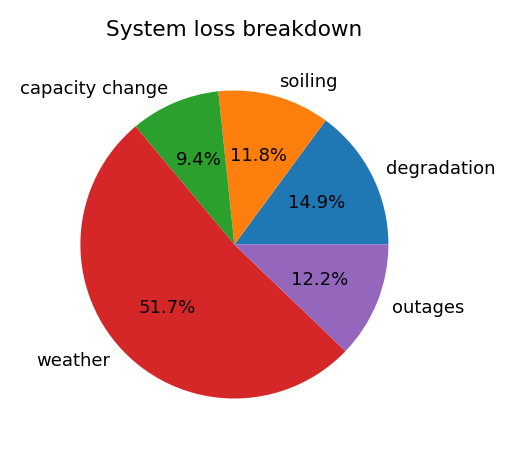

In [26]:
with plt.rc_context({'font.size': 6.5}):
    dh_2105.loss_analysis.plot_pie(figsize=(2.5, 2.5))

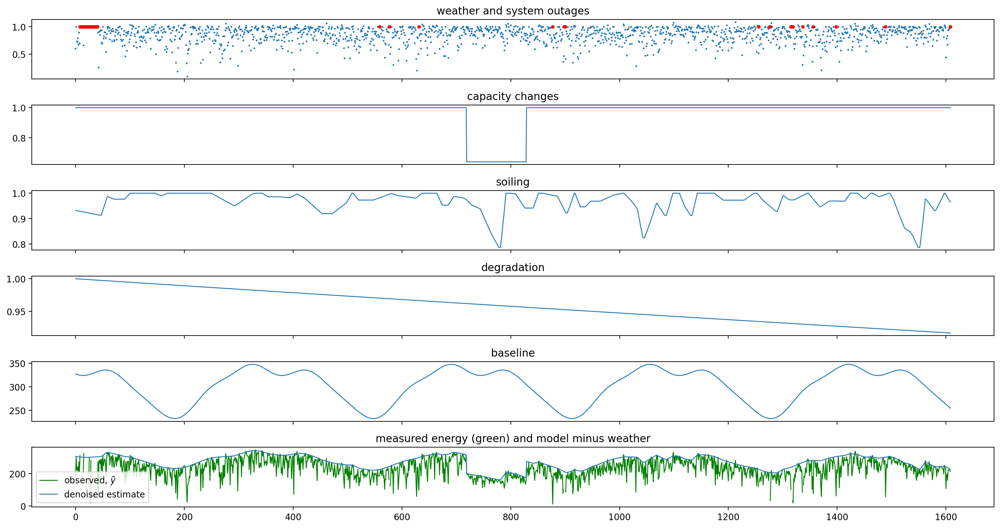

In [27]:
dh_2105.loss_analysis.plot_decomposition();

In [28]:
notebook_end = time()
print(f"Notebook ran in {(notebook_end - notebook_start)/60:.2f} minutes")

Notebook ran in 19.32 minutes
